In [1]:
# Importing the required libraries

import pyforest
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

In [2]:
# Reading the dataset using the pandas library

# Taking the date time attribute as index while reading it
PVs = pd.read_csv('demo_PVs.csv', parse_dates=['datetime'], index_col=['datetime'])

<IPython.core.display.Javascript object>

In [3]:
# Viewing the top 5 records
PVs.head()

,speed,stone,ng,sf,fan_position,temp1,temp2,temp3,temp4,c_level,draft,pressure1,pressure2,amps1,amps2,amps3,amps4,V,O2
datetime,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,76.653419,45.145515,894111.5000,1.593232,58.762703,1292.197998,962.893310,952.937256,1001.709684,74.366623,-0.053440,7.707119,0.420390,116.623772,118.951004,48.855175,112.586243,112.630844,11.785437
2021-01-01 00:01:00,76.563126,45.299534,896100.0000,1.557899,59.434826,1297.543945,965.418213,950.532715,1000.011649,70.595863,-0.050260,7.615254,0.408613,115.153938,117.358688,48.976685,111.889931,124.504967,11.034812
2021-01-01 00:02:00,76.663239,45.002090,898088.8750,1.541097,59.136620,2887.682129,965.802795,949.796631,1002.143164,68.591728,-0.067181,7.736563,0.399191,116.699142,119.026375,48.940792,112.238083,125.255187,11.319296
2021-01-01 00:03:00,76.614159,45.148914,900074.5625,1.557428,59.036079,1292.000000,961.904846,949.747559,1000.058556,69.787148,-0.061704,7.727533,0.398406,117.735565,119.977997,48.835503,112.888420,124.703842,10.911677
2021-01-01 00:04:00,76.533676,45.060978,902062.4375,1.560726,58.535873,1292.197998,960.471497,950.434570,1000.819809,73.532387,-0.059310,7.669431,0.423531,115.625038,117.886314,48.463722,112.980385,122.021696,10.740903


In [4]:
# Checking the dimensions of the data set
PVs.shape

(349860, 19)

In [5]:
# Checking the detailed information of the dataset. It can be seen that there are 349860 records and has total 20
    # attributes including the datetime taken as index value.
    
PVs.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 349860 entries, 2021-01-01 00:00:00 to 2021-08-31 23:59:00
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   speed         339322 non-null  float64
 1   stone         339321 non-null  float64
 2   ng            338906 non-null  float64
 3   sf            339323 non-null  float64
 4   fan_position  339317 non-null  float64
 5   temp1         338947 non-null  float64
 6   temp2         339321 non-null  float64
 7   temp3         339322 non-null  float64
 8   temp4         349846 non-null  float64
 9   c_level       339321 non-null  float64
 10  draft         339323 non-null  float64
 11  pressure1     339323 non-null  float64
 12  pressure2     339323 non-null  float64
 13  amps1         339322 non-null  float64
 14  amps2         339323 non-null  float64
 15  amps3         339321 non-null  float64
 16  amps4         339323 non-null  float64
 17  V             

In [6]:
# Data summarization

PVs.describe()

,speed,stone,ng,sf,fan_position,temp1,temp2,temp3,temp4,c_level,draft,pressure1,pressure2,amps1,amps2,amps3,amps4,V,O2
count,339322.000000,339321.000000,338906.000000,339323.000000,339317.000000,338947.000000,339321.000000,339322.000000,349846.000000,339321.000000,339323.000000,339323.000000,339323.000000,339322.000000,339323.000000,339321.000000,339323.000000,349853.000000,339299.000000
mean,58.882769,34.446085,496871.552808,1.486136,49.137491,2528.225382,842.684865,1013.574054,914.560954,70.656572,-0.035562,6.793718,2.243606,104.684914,106.794674,42.983923,88.005210,118.504544,6.574286
std,22.387298,14.683222,287722.928880,0.982251,18.609965,768.797821,300.551412,311.128856,231.866087,15.491073,0.081412,2.315504,3.269843,56.549100,57.107257,12.846111,34.429105,4.901966,6.916230
min,0.000000,-14.988224,0.000000,-1.997331,0.000000,0.000000,0.000000,0.000000,105.000791,-23.887032,-0.525325,-4.992541,-5.000000,-119.962311,-119.934051,0.000000,0.000000,110.000014,0.000000
25%,58.924377,34.497490,254012.074250,1.238023,51.743507,1300.316040,776.006103,868.531982,1000.440864,69.155090,-0.068319,6.908606,0.075703,114.918388,117.217354,43.290276,71.727005,114.266912,1.235469
50%,66.314751,40.022831,494379.375000,1.366162,56.002308,2970.050049,881.087891,1095.665649,1002.298634,71.231850,-0.041153,7.459006,0.657903,118.545853,120.825974,48.170223,93.299629,118.518312,3.747879
75%,71.934080,42.501991,741833.015625,1.547221,59.786865,3067.268066,1029.069702,1234.222778,1004.140989,74.178185,-0.008392,7.991741,2.464569,128.203400,130.511780,50.239571,112.527123,122.744568,10.175939
max,102.799431,62.183735,999999.687500,5.960008,68.949181,3272.594238,1655.946655,2590.988770,1005.999993,92.645279,0.536396,11.894407,15.838293,180.146805,182.295013,54.919167,155.797180,126.999981,22.293030


In [7]:
# The average speed was found to be 58.88 rpm(incase the unit is rpm). The maximum fan speed was found as 102.79 rpm.

# The average sf was found to be 1.486.

# Out of all the 4 given temperature, the temp1 was having the highest average temaprature as compared to other 3,
    #  with a value of 786.79 and even the maximum temperature was found to be for temp1 only.
    
# The average pressure for pressure1 was found to be 6.79.

# The amps1 and amps2 were having the similar values like average, min, maximum, etc. wheras amps4 was found to be double 
    # of the amps3 for the summary values.
    
# The average V value as 118.50 and the maximum was found to be 126.99.

# The maximum O2 was found as 22.29 and the average obtained was 6.57 and was having the 0 as the least value.

# Most of the attributes were having the missing values. And as it was a time series data set, it was not
    # good to remove them while using the forward fill.

In [8]:
PVs.index.min()

Timestamp('2021-01-01 00:00:00')

In [9]:
PVs.index.max()

Timestamp('2021-08-31 23:59:00')

In [10]:
PVs.head()

,speed,stone,ng,sf,fan_position,temp1,temp2,temp3,temp4,c_level,draft,pressure1,pressure2,amps1,amps2,amps3,amps4,V,O2
datetime,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,76.653419,45.145515,894111.5000,1.593232,58.762703,1292.197998,962.893310,952.937256,1001.709684,74.366623,-0.053440,7.707119,0.420390,116.623772,118.951004,48.855175,112.586243,112.630844,11.785437
2021-01-01 00:01:00,76.563126,45.299534,896100.0000,1.557899,59.434826,1297.543945,965.418213,950.532715,1000.011649,70.595863,-0.050260,7.615254,0.408613,115.153938,117.358688,48.976685,111.889931,124.504967,11.034812
2021-01-01 00:02:00,76.663239,45.002090,898088.8750,1.541097,59.136620,2887.682129,965.802795,949.796631,1002.143164,68.591728,-0.067181,7.736563,0.399191,116.699142,119.026375,48.940792,112.238083,125.255187,11.319296
2021-01-01 00:03:00,76.614159,45.148914,900074.5625,1.557428,59.036079,1292.000000,961.904846,949.747559,1000.058556,69.787148,-0.061704,7.727533,0.398406,117.735565,119.977997,48.835503,112.888420,124.703842,10.911677
2021-01-01 00:04:00,76.533676,45.060978,902062.4375,1.560726,58.535873,1292.197998,960.471497,950.434570,1000.819809,73.532387,-0.059310,7.669431,0.423531,115.625038,117.886314,48.463722,112.980385,122.021696,10.740903


In [11]:
# Handling Missing values

PVs.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 349860 entries, 2021-01-01 00:00:00 to 2021-08-31 23:59:00
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   speed         339322 non-null  float64
 1   stone         339321 non-null  float64
 2   ng            338906 non-null  float64
 3   sf            339323 non-null  float64
 4   fan_position  339317 non-null  float64
 5   temp1         338947 non-null  float64
 6   temp2         339321 non-null  float64
 7   temp3         339322 non-null  float64
 8   temp4         349846 non-null  float64
 9   c_level       339321 non-null  float64
 10  draft         339323 non-null  float64
 11  pressure1     339323 non-null  float64
 12  pressure2     339323 non-null  float64
 13  amps1         339322 non-null  float64
 14  amps2         339323 non-null  float64
 15  amps3         339321 non-null  float64
 16  amps4         339323 non-null  float64
 17  V             

In [12]:
# Null count for each attributes

# It can be seen that each attribites as a null values. Most of the attributes has more than 10K missing values,
    # whereas V & temp has only 7 and 14 values respectively.
    
PVs.isnull().sum()

speed           10538
stone           10539
ng              10954
sf              10537
fan_position    10543
temp1           10913
temp2           10539
temp3           10538
temp4              14
c_level         10539
draft           10537
pressure1       10537
pressure2       10537
amps1           10538
amps2           10537
amps3           10539
amps4           10537
V                   7
O2              10561
dtype: int64

<IPython.core.display.Javascript object>

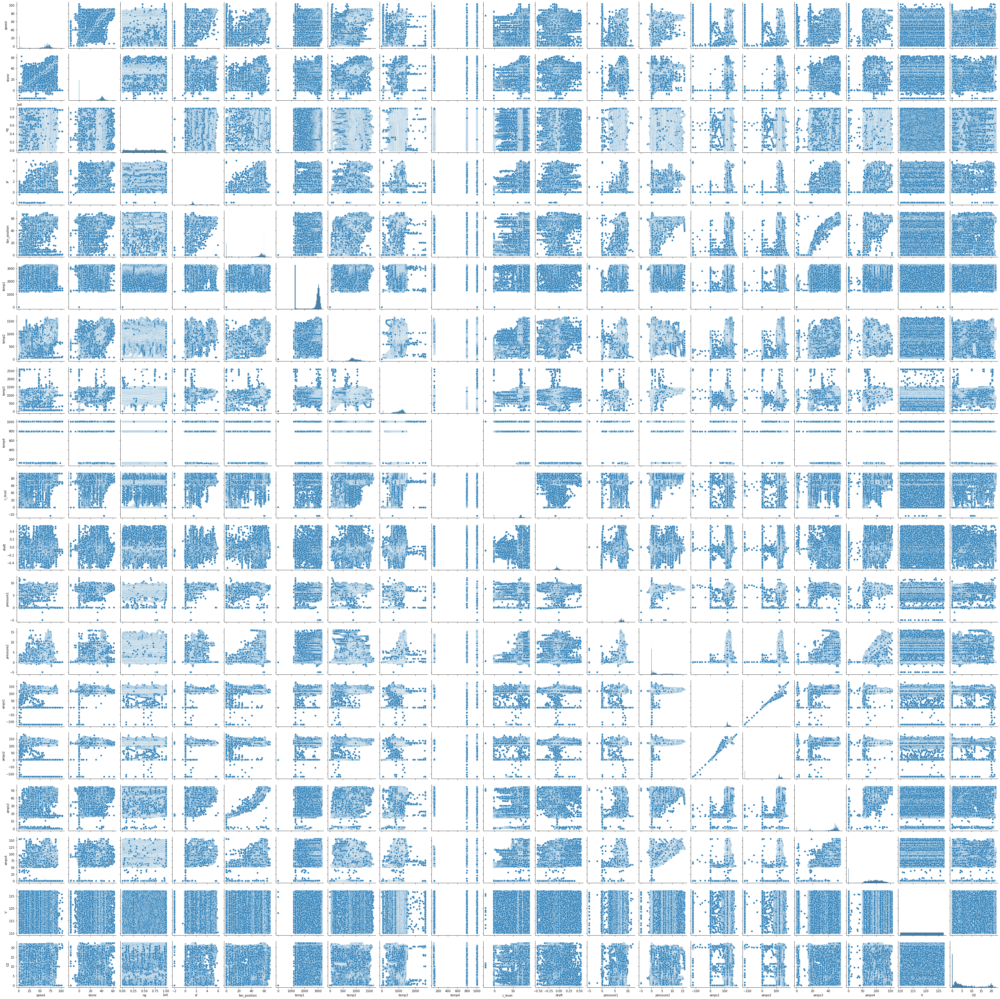

In [13]:
# Plotting all the values alltogether

sns.pairplot(PVs, palette = 'magma');

In [14]:
# Corelation calculation for Multi collinearity
PVs.corr()

,speed,stone,ng,sf,fan_position,temp1,temp2,temp3,temp4,c_level,draft,pressure1,pressure2,amps1,amps2,amps3,amps4,V,O2
speed,1.000000,0.937735,0.051016,0.621451,0.910086,0.396302,0.807175,0.649433,-0.152430,0.273273,0.109332,0.815682,0.247160,0.734265,0.734036,0.879286,0.730423,-0.000665,0.047904
stone,0.937735,1.000000,0.053507,0.563786,0.894753,0.394783,0.785602,0.639334,-0.135130,0.264540,0.116187,0.804531,0.238300,0.733394,0.733007,0.863788,0.716896,-0.000766,0.008818
ng,0.051016,0.053507,1.000000,0.031133,0.050993,0.022893,0.048588,0.061353,-0.004874,0.057133,0.015093,0.069176,0.007025,0.093038,0.093369,0.047607,0.048362,0.001006,-0.032616
sf,0.621451,0.563786,0.031133,1.000000,0.537073,0.247642,0.504452,0.455875,-0.274045,0.145139,0.051538,0.580964,0.354919,0.474362,0.474011,0.522301,0.545409,-0.000126,0.178091
fan_position,0.910086,0.894753,0.050993,0.537073,1.000000,0.427983,0.816774,0.641915,-0.081102,0.261991,0.173410,0.855968,0.219440,0.807315,0.807039,0.962641,0.736001,-0.001307,-0.009638
temp1,0.396302,0.394783,0.022893,0.247642,0.427983,1.000000,0.490116,0.331376,0.057806,0.236743,0.134584,0.409514,0.112539,0.406264,0.406015,0.434055,0.344064,-0.001039,-0.344767
temp2,0.807175,0.785602,0.048588,0.504452,0.816774,0.490116,1.000000,0.573265,-0.150673,0.267008,0.158099,0.755197,0.123076,0.736803,0.736180,0.761591,0.470062,-0.001490,0.005218
temp3,0.649433,0.639334,0.061353,0.455875,0.641915,0.331376,0.573265,1.000000,-0.034279,0.080687,0.023174,0.653054,0.364804,0.709101,0.708944,0.631528,0.648654,-0.000100,0.129332
temp4,-0.152430,-0.135130,-0.004874,-0.274045,-0.081102,0.057806,-0.150673,-0.034279,1.000000,-0.004134,0.073189,-0.144026,-0.018885,-0.096278,-0.095529,-0.053425,-0.012445,0.000204,-0.216746
c_level,0.273273,0.264540,0.057133,0.145139,0.261991,0.236743,0.267008,0.080687,-0.004134,1.000000,0.095995,0.190723,0.079172,0.028120,0.028119,0.193871,0.091579,-0.000849,-0.200153


In [15]:
# A function to calculate the corelation and plot only the lower half.

def corelationPlot(df):
    corr = df.corr()
    upperD = np.triu(corr)
    plt.figure(figsize=(25,25))
    sns.heatmap(corr, annot=True, linewidths=0.8, fmt = '0.2f', mask = upperD)
    plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

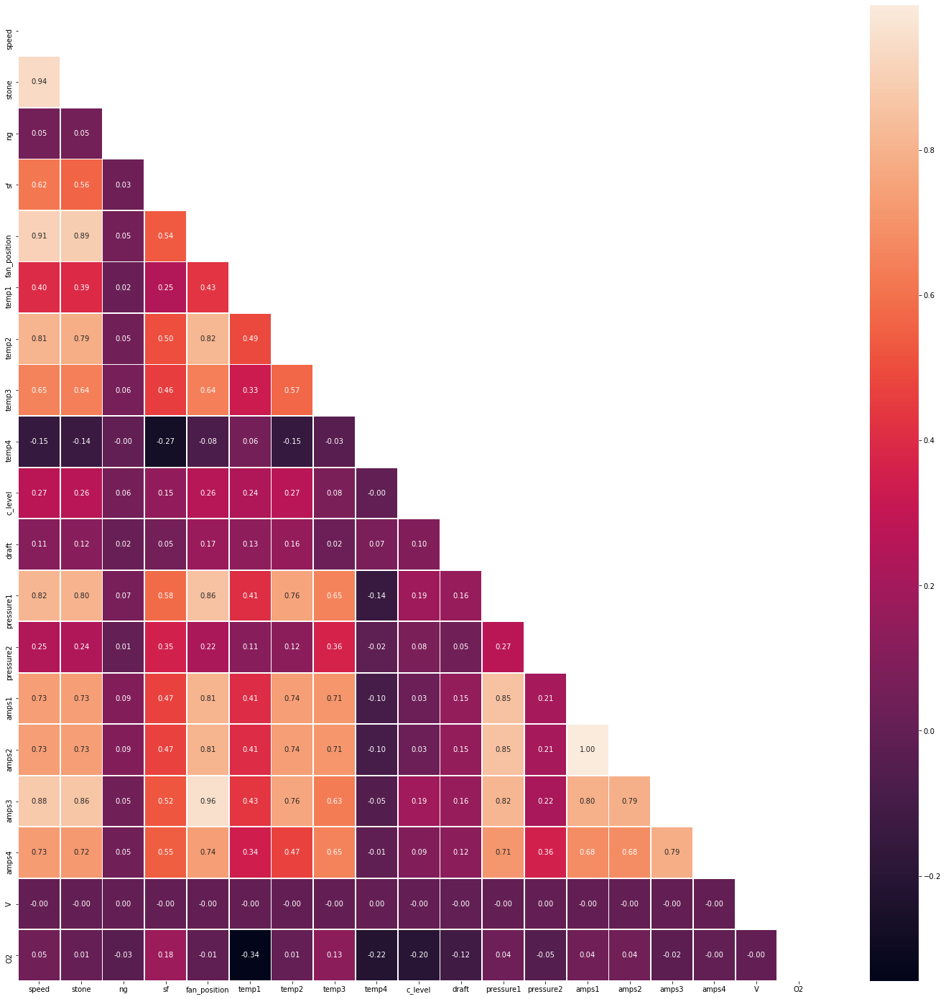

In [16]:
# plotting the corelation for the lower half

corelationPlot(PVs)

In [17]:
# Hanling missing values

# There are more than 10K missing values for most of the attributes. We can use the different techniques to impute them:
    # Mean and Median - We can't use them as it might get the effect of outliers and the imputed values might not be
        # correct
        
    # Below are the two techniques which are best suited for this dataset:
        # ffill and bfill - forward fill and backward fill as these data set are timeseries so we can take the previous
            # value that last value recored as per the time. THis method can also be tricky as the previous collected
            # value might be incorrect as well but given a situation not all value will be incorrect. Hence this 
            #method can be used
        # The next technique can be to use predict the missing value it self by considering all the attribtues with it.
            # this method can be very helpful as it predict the nearby values by taking into the effect of other variables
            # as well. For this also there are different method to do so. Using IterativeImputer which uses regression 
            # to predict all the missing values

    # NOTE: USING both the above methods for the analysis

In [18]:
# Using the ittertive imputer technique for the missing value handling

impute_it = IterativeImputer()
a = impute_it.fit_transform(PVs)

df1 = pd.DataFrame(a)
df1.columns = PVs.columns

<IPython.core.display.Javascript object>

In [19]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 349860 entries, 0 to 349859
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   speed         349860 non-null  float64
 1   stone         349860 non-null  float64
 2   ng            349860 non-null  float64
 3   sf            349860 non-null  float64
 4   fan_position  349860 non-null  float64
 5   temp1         349860 non-null  float64
 6   temp2         349860 non-null  float64
 7   temp3         349860 non-null  float64
 8   temp4         349860 non-null  float64
 9   c_level       349860 non-null  float64
 10  draft         349860 non-null  float64
 11  pressure1     349860 non-null  float64
 12  pressure2     349860 non-null  float64
 13  amps1         349860 non-null  float64
 14  amps2         349860 non-null  float64
 15  amps3         349860 non-null  float64
 16  amps4         349860 non-null  float64
 17  V             349860 non-null  float64
 18  O2  

In [20]:
df2 = PVs.copy()

In [21]:
# Using the forward fill technique for the missing value handling

df2.fillna(method = 'ffill', inplace=True)

In [22]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 349860 entries, 2021-01-01 00:00:00 to 2021-08-31 23:59:00
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   speed         349860 non-null  float64
 1   stone         349860 non-null  float64
 2   ng            349860 non-null  float64
 3   sf            349860 non-null  float64
 4   fan_position  349860 non-null  float64
 5   temp1         349860 non-null  float64
 6   temp2         349860 non-null  float64
 7   temp3         349860 non-null  float64
 8   temp4         349860 non-null  float64
 9   c_level       349860 non-null  float64
 10  draft         349860 non-null  float64
 11  pressure1     349860 non-null  float64
 12  pressure2     349860 non-null  float64
 13  amps1         349860 non-null  float64
 14  amps2         349860 non-null  float64
 15  amps3         349860 non-null  float64
 16  amps4         349860 non-null  float64
 17  V             

In [23]:
PVs.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 349860 entries, 2021-01-01 00:00:00 to 2021-08-31 23:59:00
Data columns (total 19 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   speed         339322 non-null  float64
 1   stone         339321 non-null  float64
 2   ng            338906 non-null  float64
 3   sf            339323 non-null  float64
 4   fan_position  339317 non-null  float64
 5   temp1         338947 non-null  float64
 6   temp2         339321 non-null  float64
 7   temp3         339322 non-null  float64
 8   temp4         349846 non-null  float64
 9   c_level       339321 non-null  float64
 10  draft         339323 non-null  float64
 11  pressure1     339323 non-null  float64
 12  pressure2     339323 non-null  float64
 13  amps1         339322 non-null  float64
 14  amps2         339323 non-null  float64
 15  amps3         339321 non-null  float64
 16  amps4         339323 non-null  float64
 17  V             

In [24]:
# Reusable function to plot the boxplot for all the variables inside the dataframe

def boxplotFun(df):
    
    for i in df.columns:
        sns.boxplot(x=df[i])
        plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

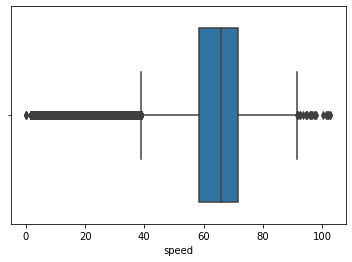

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

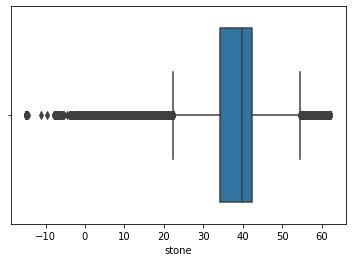

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

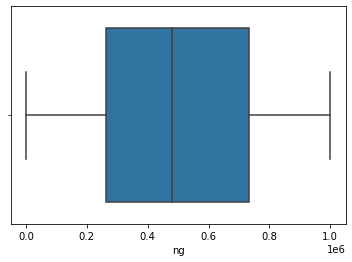

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

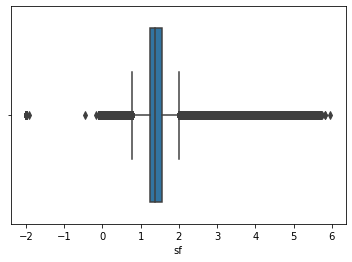

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

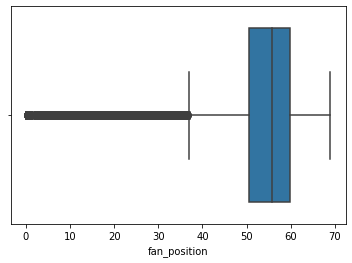

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

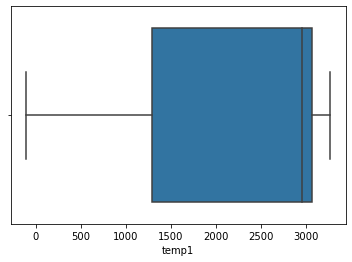

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

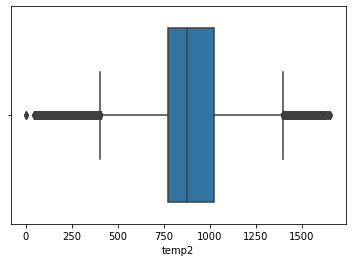

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

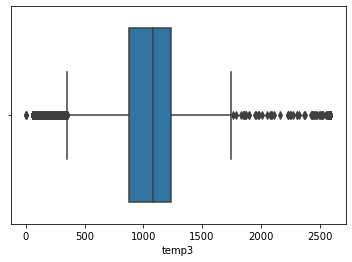

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

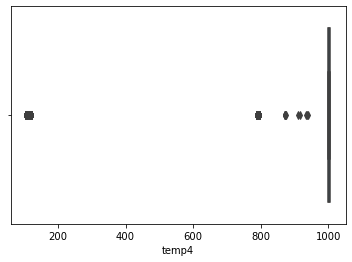

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

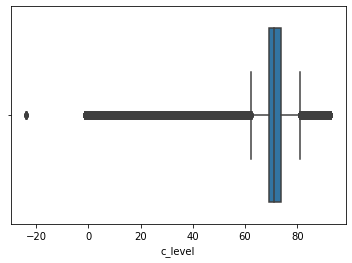

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

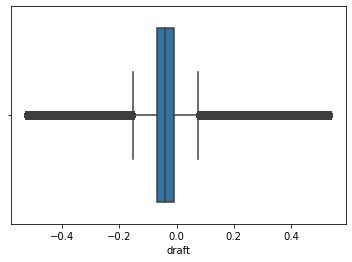

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

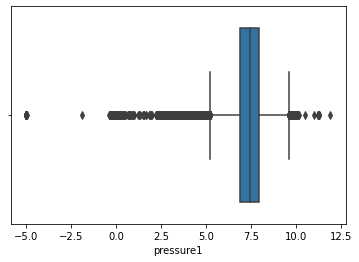

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

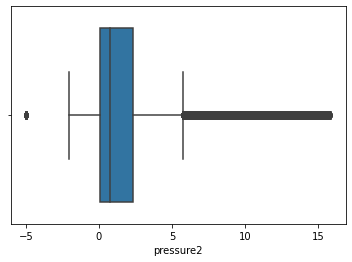

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

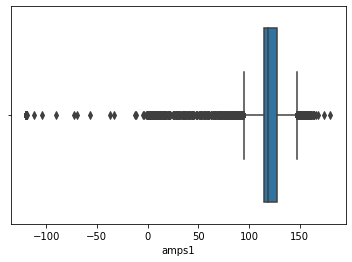

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

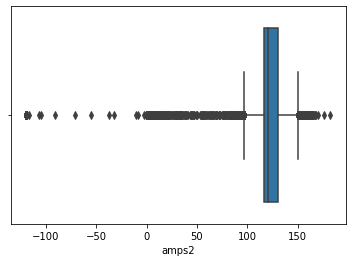

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

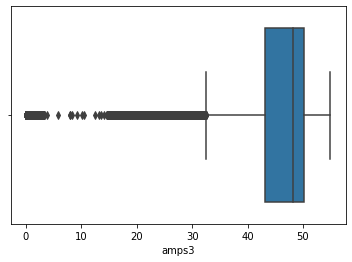

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

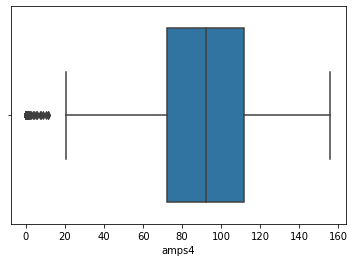

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

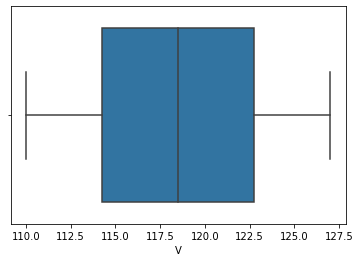

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

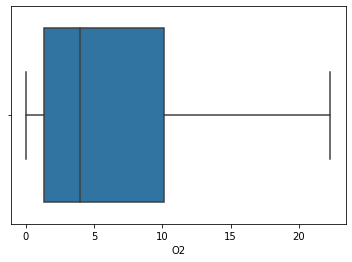

In [25]:
# Calling the boxplot function to plot all the variable for the df1
#df1 - New df where the missing values are imputed using the prediction technique (regression)

boxplotFun(df1)

# It can be seen that all the attributes has an outliers except ng, temp1, V, and O2 for df1.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

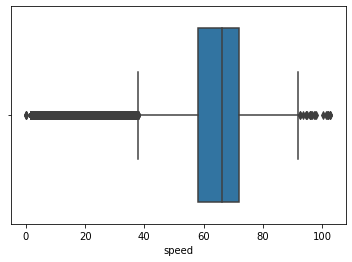

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

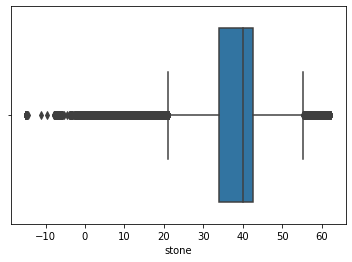

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

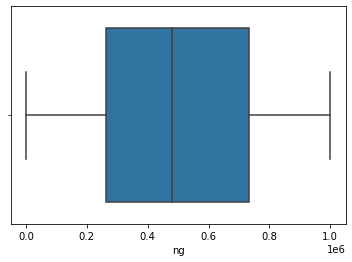

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

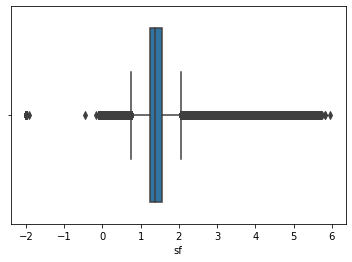

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

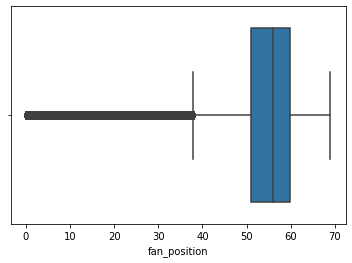

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

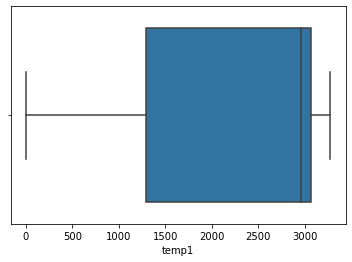

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

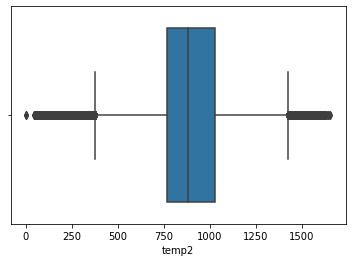

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

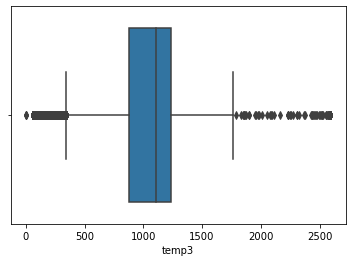

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

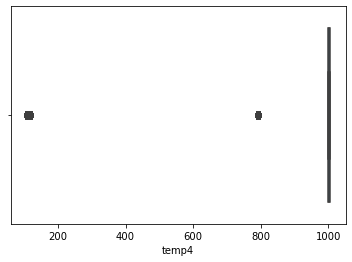

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

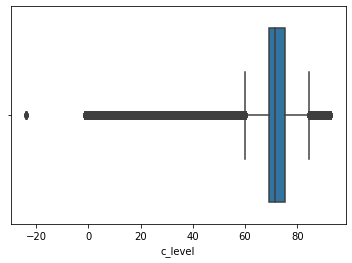

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

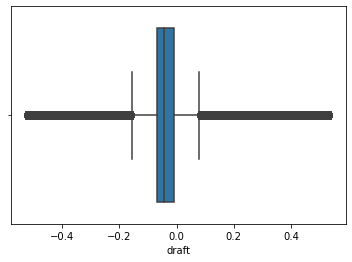

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

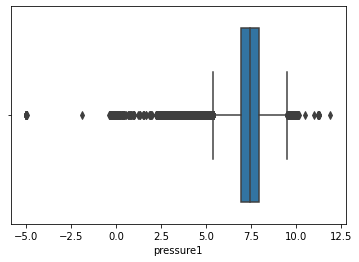

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

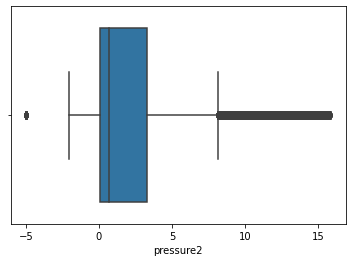

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

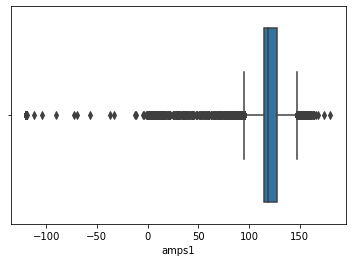

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

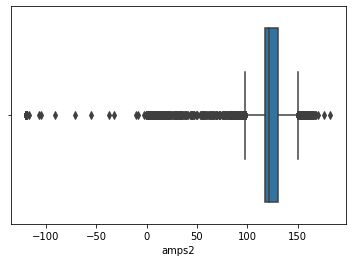

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

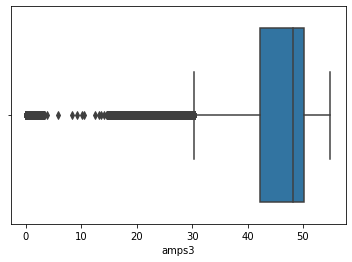

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

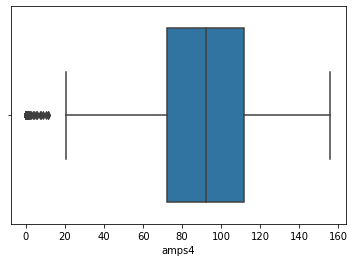

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

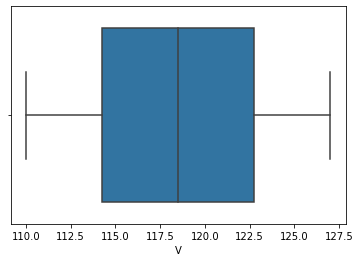

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

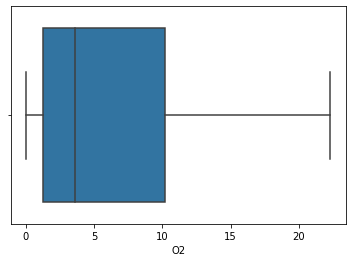

In [26]:
# Calling the boxplot function to plot all the variable for the df2
#df2 - New df where the missing values are imputed using the forward fill (previous value)
boxplotFun(df2)

# It can be seen that all the attributes has an outliers except ng, temp1, V, and O2 for df1.

In [27]:
# Outlier removal 
# Computing IQR - df1


In [28]:
# IQR Inter Quartile Technique was used to handle the outliers

# IQR function which calculates the upper and lower limit of the attributes
def outlierlimit(a):
    
    # Q1 - 25 percentile
    Q1 = a.quantile(0.25)
    
    # Q5 - 75 percentile
    Q3 = a.quantile(0.75)
    IQR = Q3 - Q1
    
    lowerLimit = Q1 - (1.5*IQR)
    upperLimit = Q3 + (1.5*IQR)
    
    return lowerLimit, upperLimit

In [29]:
# Function to handle the outliers.

# We are not dropping the outliers. in place of that the values below the lower limit and the above the upper limit will
    # be replaced with the lower limit and upper limit respectively.
    
def outlierRemoval(inp):
    for i in inp.columns:
        llimit,ulimit = outlierlimit(inp[i])
        inp[i] = inp[i].apply(lambda x: llimit if x < llimit else x)
        inp[i] = inp[i].apply(lambda x: ulimit if x > ulimit else x)

In [30]:
# outlier removal for df1
outlierRemoval(df1)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

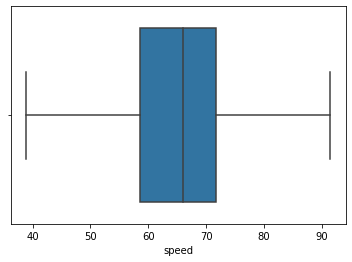

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

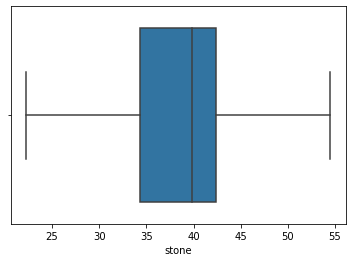

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

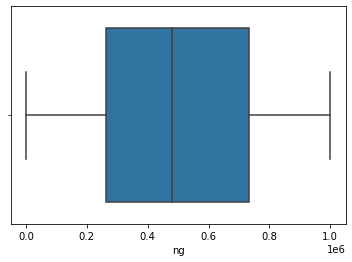

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

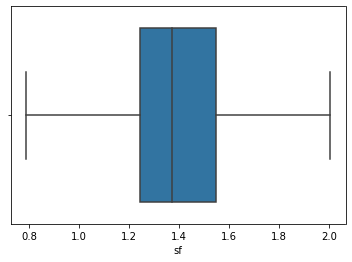

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

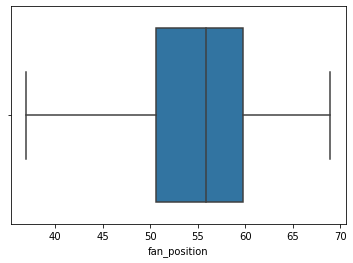

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

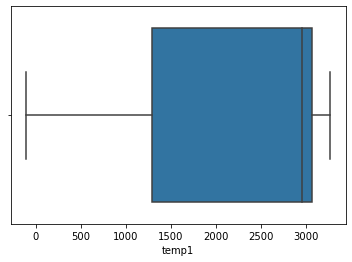

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

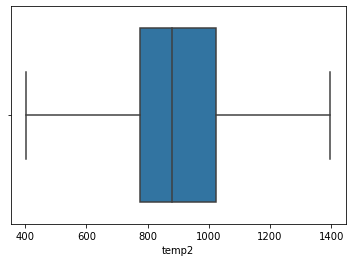

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

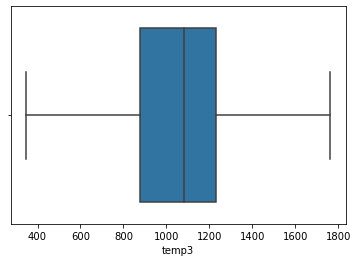

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

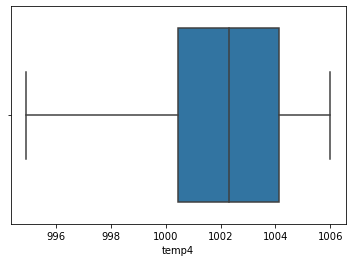

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

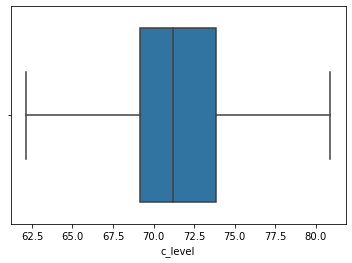

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

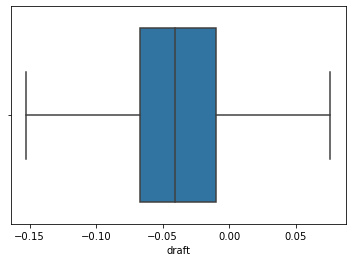

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

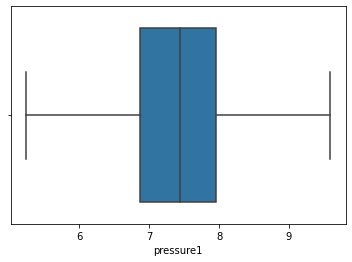

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

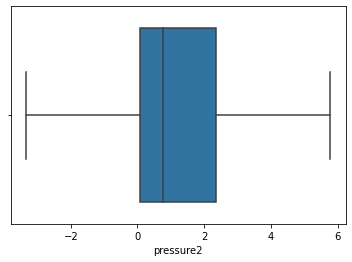

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

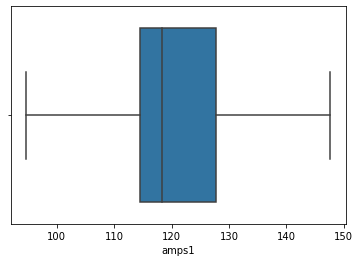

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

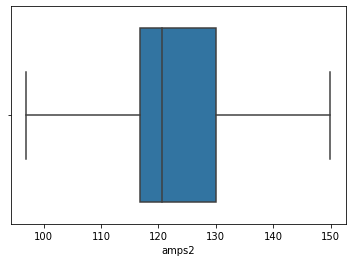

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

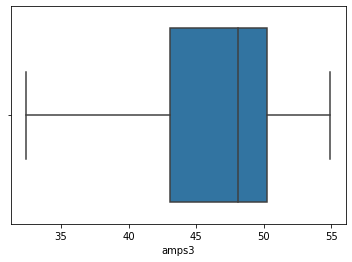

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

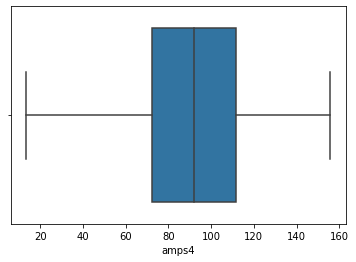

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

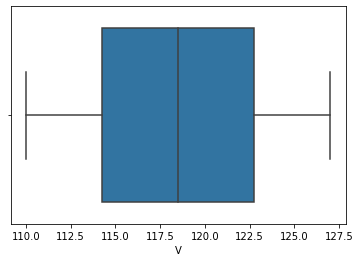

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

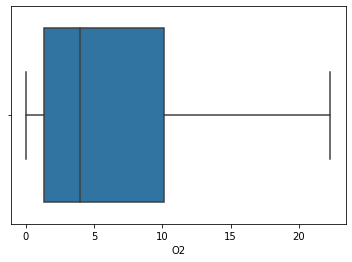

In [31]:
# Boxplot after handling outliers

boxplotFun(df1)

<IPython.core.display.Javascript object>

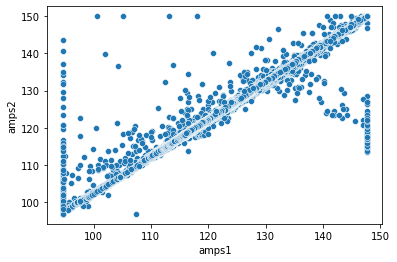

In [32]:
sns.scatterplot(x= df1['amps1'], y = df1['amps2']);

<IPython.core.display.Javascript object>

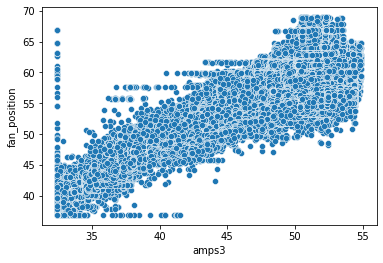

In [33]:
sns.scatterplot(x= df1['amps3'], y = df1['fan_position']);

<IPython.core.display.Javascript object>

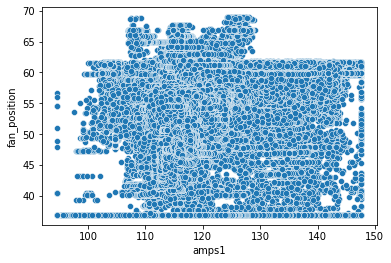

In [34]:
sns.scatterplot(x= df1['amps1'], y = df1['fan_position']);

<IPython.core.display.Javascript object>

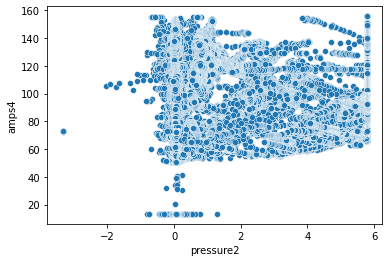

In [35]:
sns.scatterplot(x= df1['pressure2'], y = df1['amps4']);

In [36]:
# outlier removal for df2
outlierRemoval(df2)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

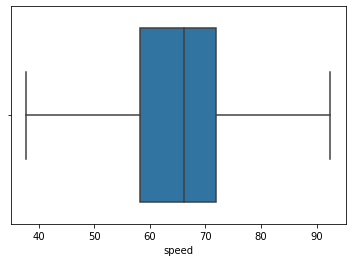

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

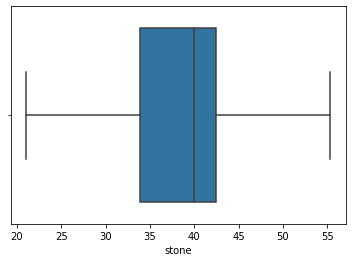

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

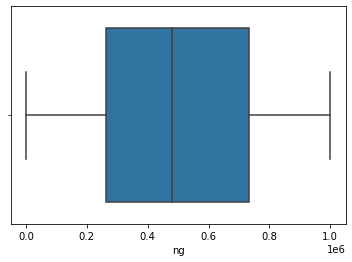

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

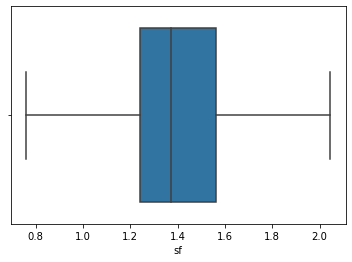

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

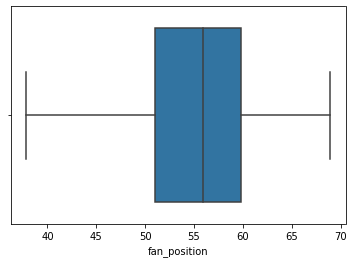

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

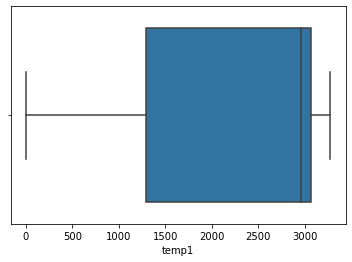

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

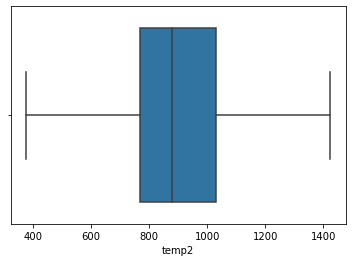

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

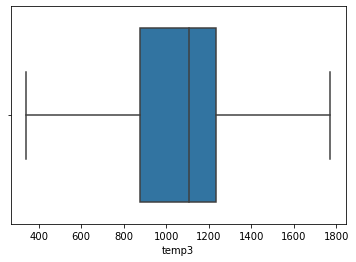

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

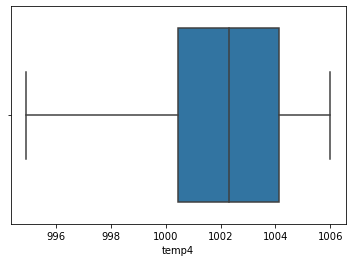

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

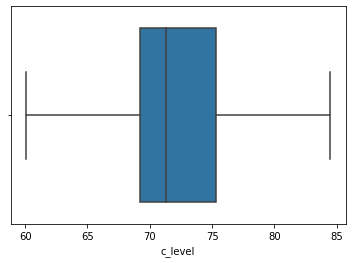

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

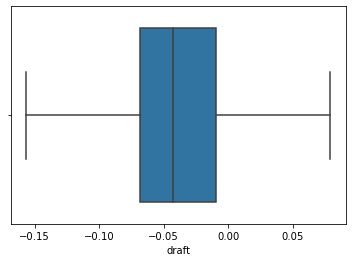

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

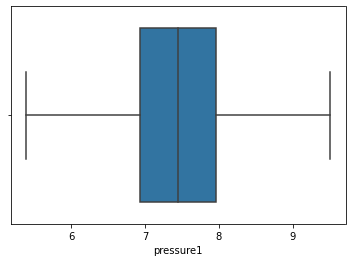

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

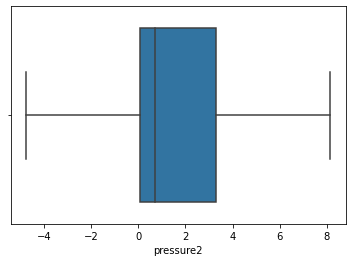

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

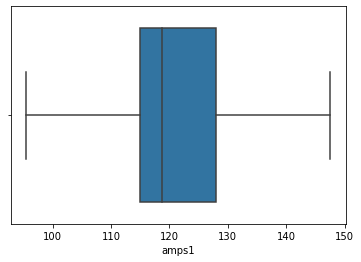

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

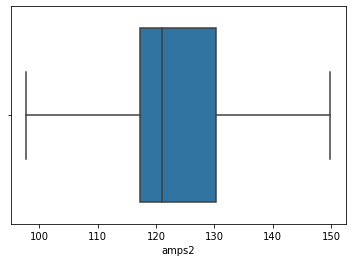

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

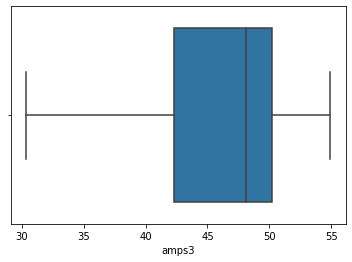

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

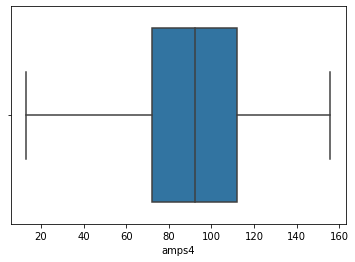

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

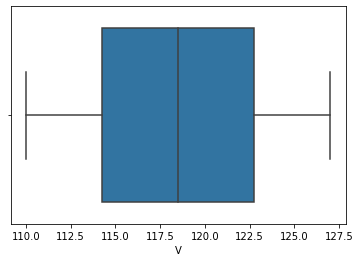

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

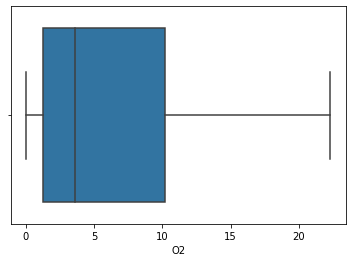

In [37]:
# Boxplot after handling outliers

boxplotFun(df2)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

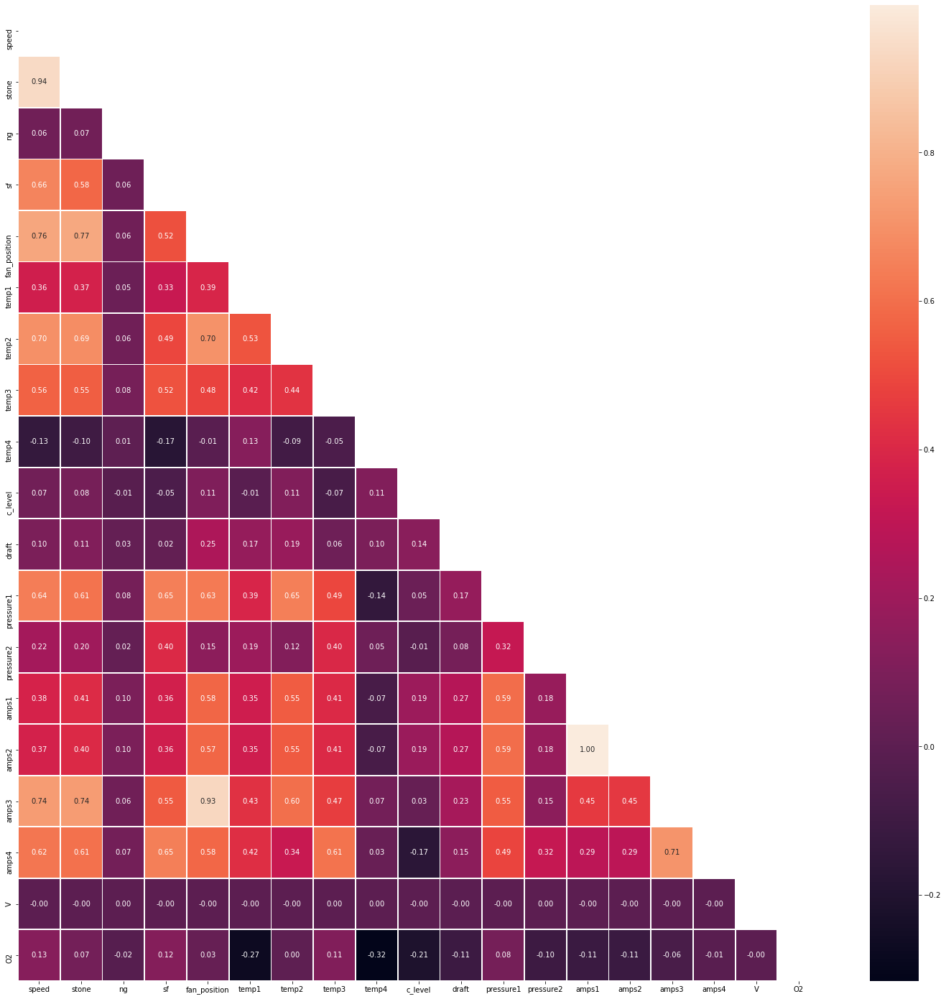

In [38]:
# plotting the corelation for the lower half - df1

corelationPlot(df1)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

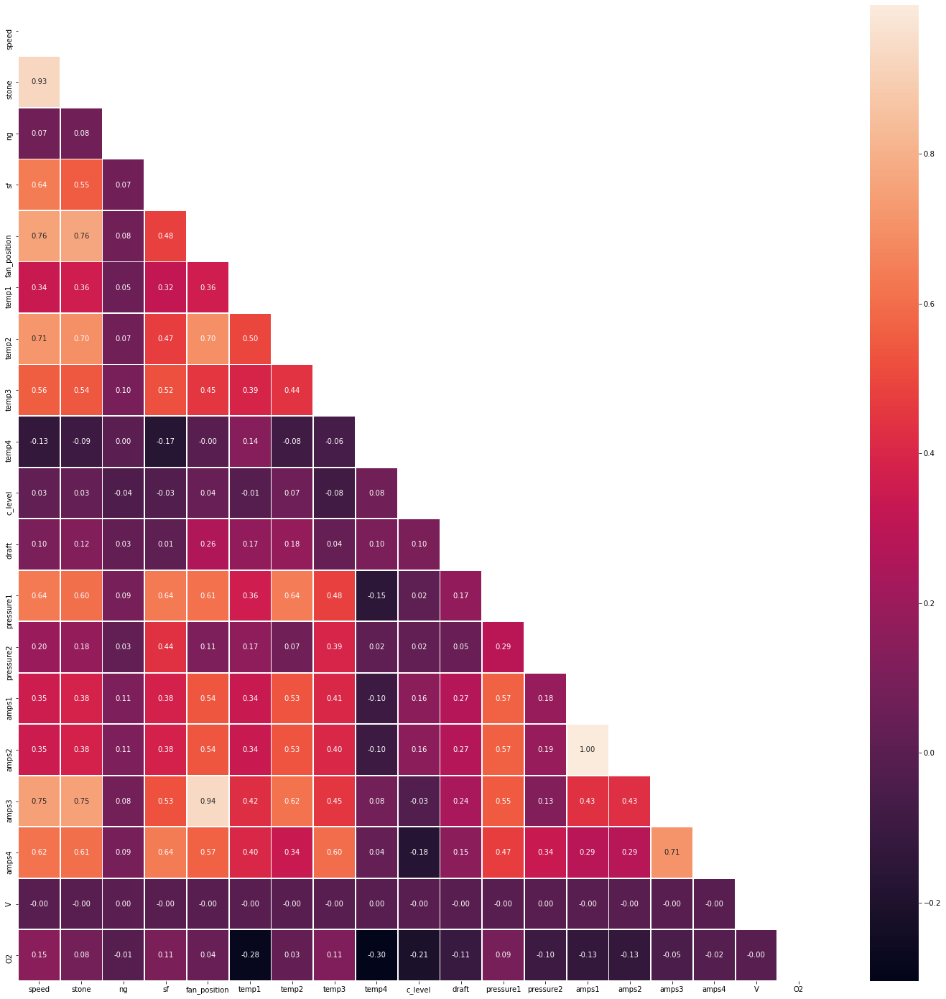

In [39]:
# plotting the corelation for the lower half - df2

corelationPlot(df2)

In [40]:
# Function to choose the remove the features that leads  to multi-collinearity. This can also be verified
    # with different tests.

def featureSelMul(df):
    
    corr_matrix = df.corr().abs()

    # Select upper triangle of correlation matrix
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

    # Find features with correlation greater than 0.7
    to_drop = [column for column in upper.columns if any(upper[column] > 0.7)]

    # Drop features 
    df.drop(to_drop, axis=1, inplace=True)

In [41]:
# Dataframe after taking the attributes based on corelation for df1

df3= df1.copy()
featureSelMul(df3)
df3.info()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 349860 entries, 0 to 349859
Data columns (total 13 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   speed      349860 non-null  float64
 1   ng         349860 non-null  float64
 2   sf         349860 non-null  float64
 3   temp1      349860 non-null  float64
 4   temp3      349860 non-null  float64
 5   temp4      349860 non-null  float64
 6   c_level    349860 non-null  float64
 7   draft      349860 non-null  float64
 8   pressure1  349860 non-null  float64
 9   pressure2  349860 non-null  float64
 10  amps1      349860 non-null  float64
 11  V          349860 non-null  float64
 12  O2         349860 non-null  float64
dtypes: float64(13)
memory usage: 34.7 MB


<IPython.core.display.Javascript object>

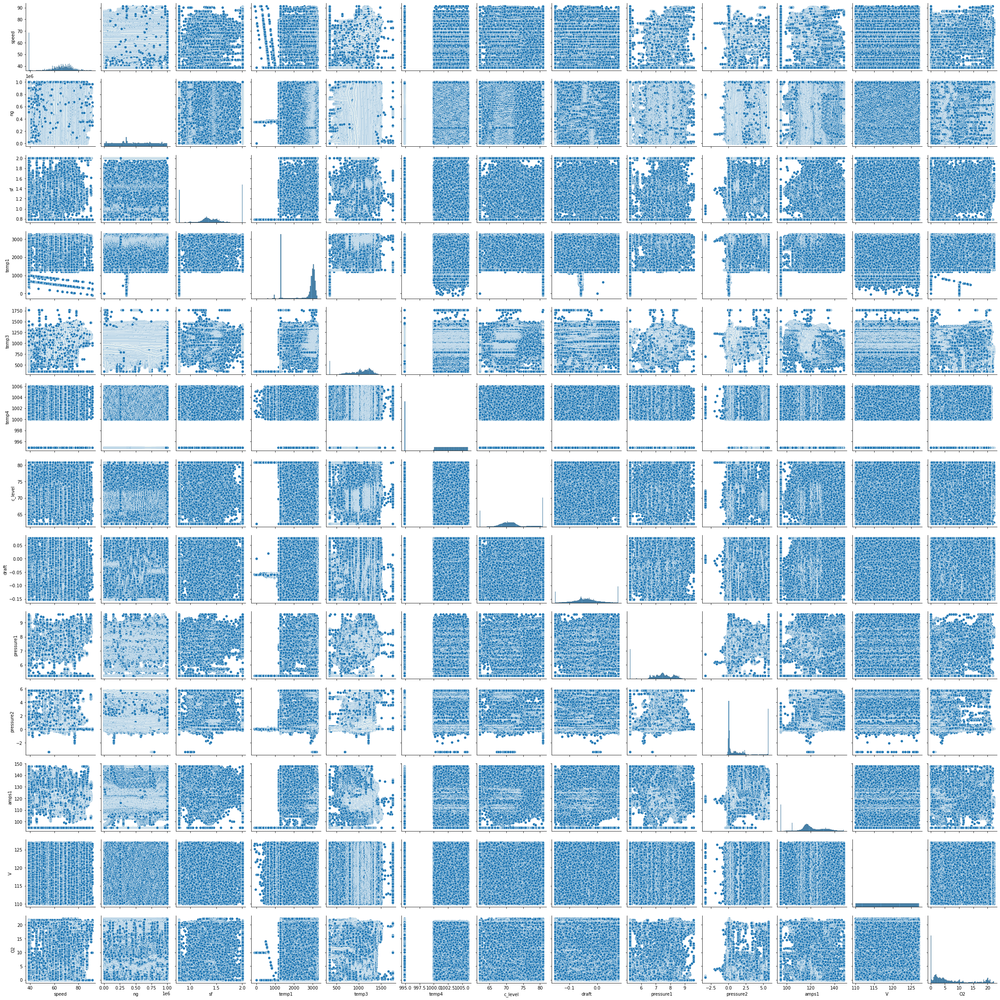

In [42]:
sns.pairplot(df3, palette = 'magma');

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

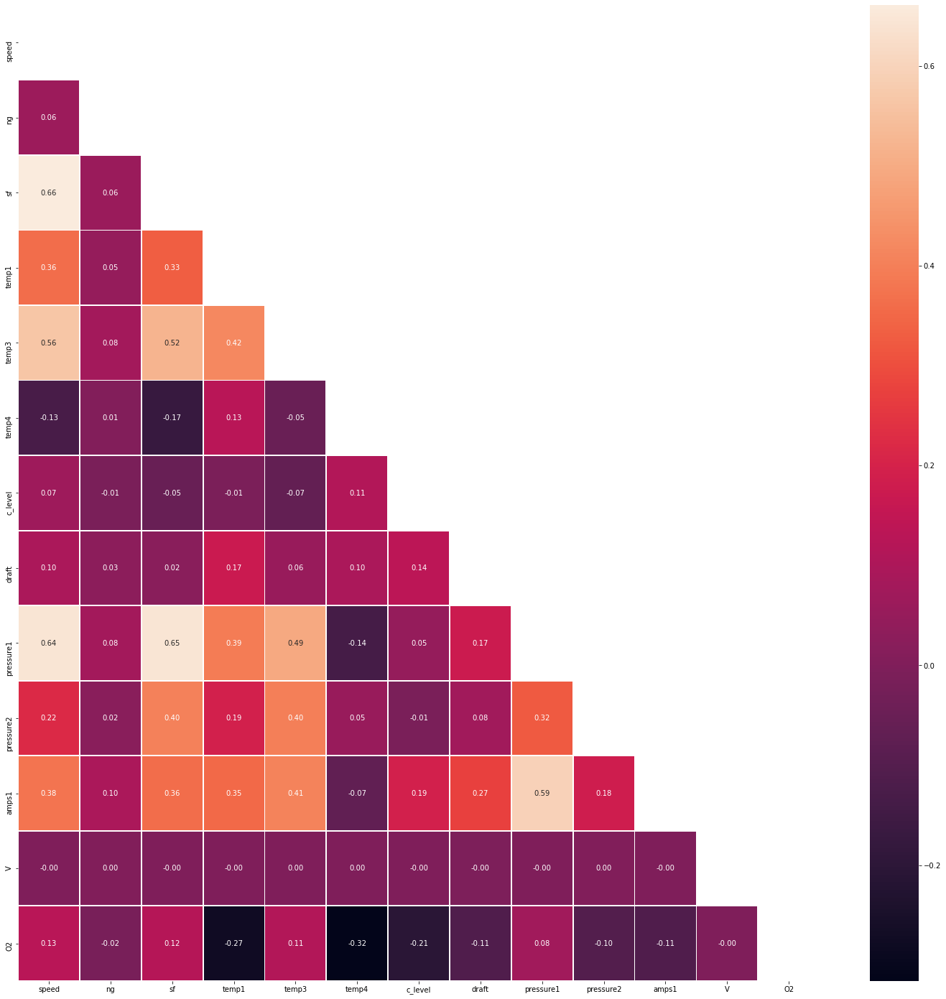

In [43]:
corelationPlot(df3)

In [44]:
# Dataframe after taking the attributes based on corelation for df2

df4= df2.copy()
featureSelMul(df4)
df4.info()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 349860 entries, 2021-01-01 00:00:00 to 2021-08-31 23:59:00
Data columns (total 13 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   speed      349860 non-null  float64
 1   ng         349860 non-null  float64
 2   sf         349860 non-null  float64
 3   temp1      349860 non-null  float64
 4   temp3      349860 non-null  float64
 5   temp4      349860 non-null  float64
 6   c_level    349860 non-null  float64
 7   draft      349860 non-null  float64
 8   pressure1  349860 non-null  float64
 9   pressure2  349860 non-null  float64
 10  amps1      349860 non-null  float64
 11  V          349860 non-null  float64
 12  O2         349860 non-null  float64
dtypes: float64(13)
memory usage: 37.4 MB


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

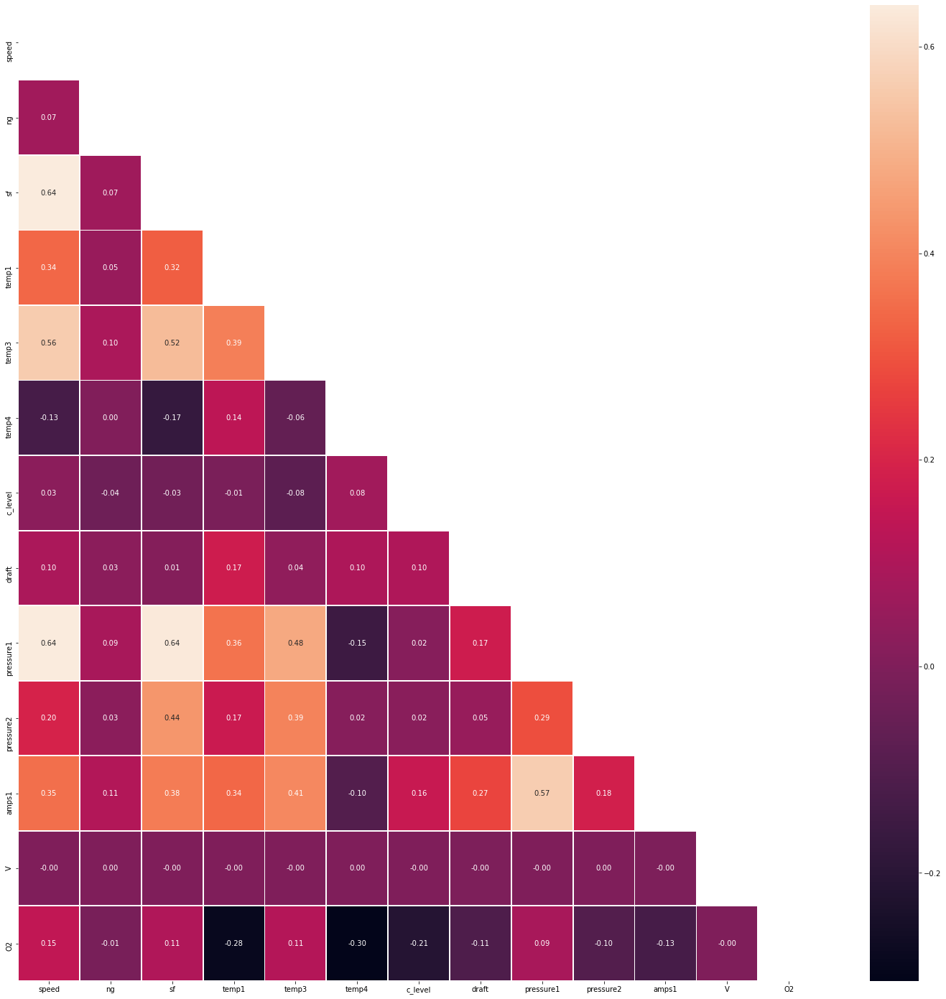

In [45]:
corelationPlot(df4)

In [46]:
# Model Building

In [47]:
# Creating a function to split the data to train & test
def dataSplit(df):
   
    # independent variables
    X = df.drop('O2', axis = 1)
    
    # Taking the dependent variables
    y = df['O2']
    
    # Spliting the data set to 77:33 ratio
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.33, random_state = 5)
    return X_train,X_test,y_train,y_test

In [48]:
# Function to calculate the performance metrics - The chosen metrics are R2, Adjusted R2, RMSE. The best metrics
    # to be used is Adj R2 and RMSE

def perfMetrics(y_true, y_pred,X):
    
    # R2 calculation
    r2 = r2_score(y_true, y_pred)
    
    # Adj R2 calculation
    adjr2 = 1 - ((1-r2)*(len(X)-1)/(len(X)-X.shape[1]-1))
    
    # RMSE calculation
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    
    # Printing the calculated metrics
    print("R2 score is", r2)
    print("Adj R2 score is", adjr2)
    print("RMSE score is", rmse)
    
    return r2, adjr2, rmse

In [49]:
# Function to build and predict using the Multiple Linear Regression

def modelMLR(X_train,X_test,y_train,y_test):
    
    # MLR Model
    lm = LinearRegression()
    
    # Model Fit
    model = lm.fit(X_train, y_train)
    
    #Model prediction
    y_pred = model.predict(X_test)
    
    # Calling the performance metrics to calculate the R2, Adj R2, RMSE
    r2, adjr2, rmse = perfMetrics(y_test, y_pred, X_train)


In [50]:
# Function to build and predict using the Decision Tree Regressor

def modelDTR(X_train,X_test,y_train,y_test):
    dtR = DecisionTreeRegressor(random_state = 5)
    
    # fit the regressor with X and Y data
    dtRmodel = dtR.fit(X_train, y_train)

    # Model Fit
    y_pred = dtRmodel.predict(X_test)
    
    # Calling the performance metrics to calculate the R2, Adj R2, RMSE
    r2, adjr2, rmse = perfMetrics(y_test, y_pred, X_train)

In [51]:
# Function to build and predict using the Random Forest Regressor

def modelrfR(X_train,X_test,y_train,y_test):
    
    rfR = RandomForestRegressor(random_state = 5)
    
    # fit the regressor with X and Y data
    rfRmodel = rfR.fit(X_train, y_train)

    # Model Fit
    y_pred = rfRmodel.predict(X_test)
    
    # Calling the performance metrics to calculate the R2, Adj R2, RMSE
    r2, adjr2, rmse = perfMetrics(y_test, y_pred, X_train)


**DF1 - Taking the entire data set where the outliers were handled and the missing values were handled using the prediction technique (i.e. Regression to predict the missing values)**

In [52]:
# Model 1 - MLR

X_train,X_test,y_train,y_test = dataSplit(df1)
modelMLR(X_train,X_test,y_train,y_test)

<IPython.core.display.Javascript object>

R2 score is 0.3477308298617354
Adj R2 score is 0.3476807381541642
RMSE score is 5.514518617367877


In [53]:
# Model 2 - DTR
modelDTR(X_train,X_test,y_train,y_test)

R2 score is 0.9722952776010678
Adj R2 score is 0.9722931499873214
RMSE score is 1.1365042988518739


In [54]:
# Model 3 - RFR
modelrfR(X_train,X_test,y_train,y_test)

R2 score is 0.9872301959860692
Adj R2 score is 0.9872292153153313
RMSE score is 0.7715894792074476


**DF2 - Taking the data set where the outliers were handled and the missing values were handled using the previous value (i.e. ffill to impute the missing values)**

In [55]:
# Model 4 - MLR

X_train,X_test,y_train,y_test = dataSplit(df2)
modelMLR(X_train,X_test,y_train,y_test)

<IPython.core.display.Javascript object>

R2 score is 0.36613701275669397
Adj R2 score is 0.36608833457159684
RMSE score is 5.518340786350197


In [56]:
# Model 5 - DTR
modelDTR(X_train,X_test,y_train,y_test)

R2 score is 0.9700277632680008
Adj R2 score is 0.9700254615180693
RMSE score is 1.1999700246938716


In [57]:
# Model 6 - RFR
modelrfR(X_train,X_test,y_train,y_test)

R2 score is 0.9853525529187702
Adj R2 score is 0.9853514280524276
RMSE score is 0.8388644486250834


**DF3 - Taking the entire data set where the outliers were handled and the missing values were handled using the prediction technique (i.e. Regression to predict the missing values) and then features were selected based on the correlation values (i.e. filtering the features from the df1 using the correlation value)**

In [58]:
# Model 7 - MLR

X_train,X_test,y_train,y_test = dataSplit(df3)
modelMLR(X_train,X_test,y_train,y_test)

<IPython.core.display.Javascript object>

R2 score is 0.28573905742062056
Adj R2 score is 0.28570249006873316
RMSE score is 5.770622073084083


In [59]:
# Model 8 - DTR
modelDTR(X_train,X_test,y_train,y_test)

R2 score is 0.9659921602184888
Adj R2 score is 0.965990419150806
RMSE score is 1.2591680757704395


In [60]:
# Model 9 - RFR
modelrfR(X_train,X_test,y_train,y_test)

R2 score is 0.9843985070154024
Adj R2 score is 0.9843977082803045
RMSE score is 0.8528590483204428


**DF4 - Taking the entire data set where the outliers were handled and the missing values were handled using the prediction technique (i.e. Regression to predict the missing values) and then features were selected based on the correlation values (i.e. filtering the features from the df2 using the correlation value)**

In [61]:
# Model 10 - MLR

X_train,X_test,y_train,y_test = dataSplit(df4)
modelMLR(X_train,X_test,y_train,y_test)

<IPython.core.display.Javascript object>

R2 score is 0.2939987304125309
Adj R2 score is 0.29396258592342484
RMSE score is 5.823895335496354


In [62]:
# Model 11 - DTR
modelDTR(X_train,X_test,y_train,y_test)

R2 score is 0.9635094198897438
Adj R2 score is 0.9635075517155179
RMSE score is 1.3240403007177024


In [63]:
# Model 12 - RFR
modelrfR(X_train,X_test,y_train,y_test)

R2 score is 0.9828072384528452
Adj R2 score is 0.9828063582510536
RMSE score is 0.9088320631209607


In [64]:
# There were total 12 models which were built using Multiple Linear Regression, Decision Tree Regressor, 
    # and Random Forest Regressor. The metrics were calculated for each to determine the best performing models.
    
# Model 3 as for these model can be taken as it has got the best combination for the Adj R2 and RMSE, where the 
    # RMSE value was found to be the least.